# Récupération des données Stack OverFlow

La récupération des données de Stack Overflow est un peu compliqué nous devons partitionner nos données et faire des extractions petit à petit.
Une première analyse de la structure de la base nous a ammené a vouloir filtrer les posts en ne selectionnant que les questions. Pour pouvoir extraire un même nombre de paquet (car les identifiants n'ont pas des valeurs continues) nous utilisons la fonction dense_rank() qui permet de réaffecter un nouvel index a chaque ligne de façon continu. Nous utilisons aussi une fonction with, car l'interpreteur SQL de la base ne permet pas les select imbriqués. 

Ci-dessous un aperçu de la requête utilisée pour l'extraction de données

with extract_post as 
( select * , dense_rank() over (order by id asc) as rank from posts 
where PostTypeId = 1 
)
select * from extract_post
where rank >= 30000
and rank < 60000

## Import des données

In [45]:
#Declaration des imports utilise pour l'analyse des donnees
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import os
import glob
from datetime import datetime
from tqdm.auto import tqdm

pd.options.display.max_rows = 40

In [46]:
# Import all libraries
import pandas as pd
import numpy as np
import re

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

#handling html data
from bs4 import BeautifulSoup

import tensorflow as tf

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
%matplotlib inline


In [47]:
def print_now() :
    # datetime object containing current date and time
    now = datetime.now()
    print("now =", now)

In [48]:
print_now()
pd.options.display.max_columns = 106
workingDir = os.getcwd()
dataDir = os.path.join(workingDir,'Data','posts')
lFiles = []
for file in glob.glob(dataDir + "/QueryResults*.csv"):
    print('Loading file : ' + file)
    dfTemp = pd.read_csv(file,sep=',')
    lFiles.append(dfTemp)
    del dfTemp
    
df = pd.concat(lFiles, axis=0, ignore_index=True)
n = len(lFiles)
for i in range(n) :
    del lFiles[n-1-i]

now = 2022-08-20 10:37:24.252795
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_01.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_02.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_03.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_04.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_05.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_06.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_07.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_08.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_09.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_10.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\QueryResults_11.csv
Loading file : D:\OpenClassroom\tag_prediction_nlp\Data\posts\Que

In [49]:
len(df)

999999

In [50]:
df.columns

Index(['Id', 'PostTypeId', 'AcceptedAnswerId', 'ParentId', 'CreationDate',
       'DeletionDate', 'Score', 'ViewCount', 'Body', 'OwnerUserId',
       'OwnerDisplayName', 'LastEditorUserId', 'LastEditorDisplayName',
       'LastEditDate', 'LastActivityDate', 'Title', 'Tags', 'AnswerCount',
       'CommentCount', 'FavoriteCount', 'ClosedDate', 'CommunityOwnedDate',
       'ContentLicense', 'rank'],
      dtype='object')

Toute cette liste de colonne n'est pas utile pour la génération de tag. Nous pouvons nous séparer d'un bon nombre de colonne.

In [51]:
df.drop(columns=['PostTypeId','AcceptedAnswerId','ParentId','DeletionDate','ViewCount','LastEditorUserId', 'LastEditorDisplayName',
       'LastEditDate', 'LastActivityDate','CommentCount', 'FavoriteCount', 'ClosedDate', 'CommunityOwnedDate',
        'CreationDate', 'OwnerUserId', 'OwnerDisplayName',
       'ContentLicense'], inplace = True)

In [52]:
df

,Id,Score,Body,Title,Tags,AnswerCount,rank
0,250001,21,<p>Will we get our reputation moved over or qu...,Will the questions be migrated over from meta....,<discussion><meta><mso-mse-split>,4,1
1,250006,22,"<p>When I opened up the site-switcher, the fir...",Halp! The favicon is borked!,<bug><status-completed><favicon>,2,2
2,250010,21,"<p><a href=""http://chat.meta.stackoverflow.com...",Bring Tavern on the Meta to meta.SE,<feature-request><status-completed><chat>,0,3
3,250012,20,<p>Here's what I mean. Take this vanilla scre...,The system message theme is...jarring,<feature-request><status-bydesign><design><sys...,1,4
4,250013,28,"<blockquote>\n <p><img src=""https://i.stack.i...",The [featured] tag is not a mod-only tag,<bug><status-completed><tags>,1,5
...,...,...,...,...,...,...,...
999994,4242316,1,"<p>No, I'm not trying to see how many buzzword...",AJAX long-polling a REST API/Memcached in a PH...,<php><jquery><ajax><rest><long-polling>,1,999995
999995,4242326,5,"<p>I asked <a href=""https://stackoverflow.com/...",Remote debugging using Eclipse - How to set br...,<java><eclipse><remote-debugging>,1,999996
999996,4242327,0,<pre><code> // Standard Template Library ex...,Coding is breaking when port from GCC 3.1.2 to...,<c++>,3,999997
999997,4242328,6,<p>How to show $\{ X_t \}$ of Latex in the tit...,how to show $\{ X_t \}$ in the title of a plot...,<r><plotmath>,3,999998


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999999 entries, 0 to 999998
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   Id           999999 non-null  int64 
 1   Score        999999 non-null  int64 
 2   Body         999999 non-null  object
 3   Title        999999 non-null  object
 4   Tags         999999 non-null  object
 5   AnswerCount  999999 non-null  int64 
 6   rank         999999 non-null  int64 
dtypes: int64(4), object(3)
memory usage: 53.4+ MB


Pour pouvoir exploiter les tags nous allons les transformer en enlevant les balises html et en utilsant l'espace comme séparateur.

In [54]:
df['Tags'] = df.Tags.apply(lambda x : x.replace(' ', '-').replace('<','').replace('>',' ').strip(' '))

In [55]:
df['NumberTags'] = df.Tags.apply(lambda x : len(x.split(' ')))

In [56]:
print_now()

now = 2022-08-20 10:39:21.059752


Affichons la distribution de notre data

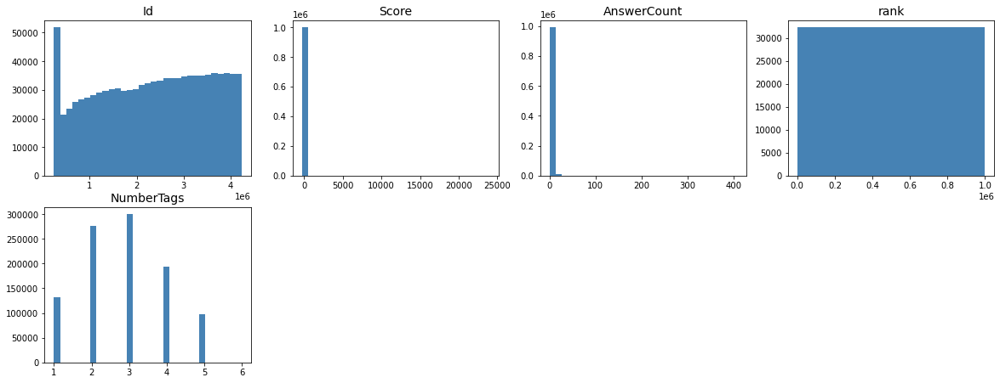

In [57]:
fig = plt.figure(figsize=(20, 60))
colSelFloat = list(df.select_dtypes(include=np.number).columns)
dfFloat = df[colSelFloat]
dfFloat.shape[1]
for feat_idx in range(dfFloat.shape[1]):
    ax = fig.add_subplot(15,4, (feat_idx+1))
    h = ax.hist(dfFloat[dfFloat.columns[feat_idx]], bins=31, color='steelblue', edgecolor='none')
    ax.set_title(dfFloat.columns[feat_idx], fontsize=14)

### Analyse du nombre de tags par question

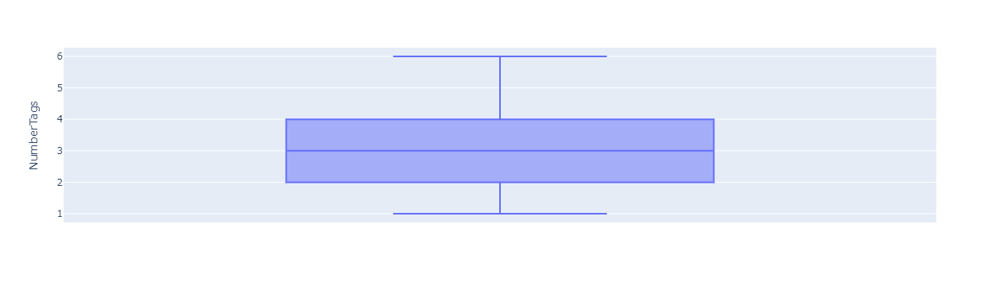

In [58]:
fig = px.box(df, y="NumberTags")
fig.show()

Chaque question a au moins un tag, et au plus 5 tags. Un nombre moyen de tags situé aux alentours de 3. Pour notre modèle qui est seulement là pour proposer des tags, il faudrait le paramétrer pour ne pas proposer plus de 3 tags. Nous ne cherchons pas à deviner tous les tags mais seulement en proposer quelques uns aux utilisateurs. Libre à eux d'en rajouter s'ils en trouvent d'autres plus pertinents et adéquats

### Nombre de question par tags

In [59]:
print_now()

now = 2022-08-20 10:39:46.340824


In [60]:
from collections import Counter
from itertools import chain

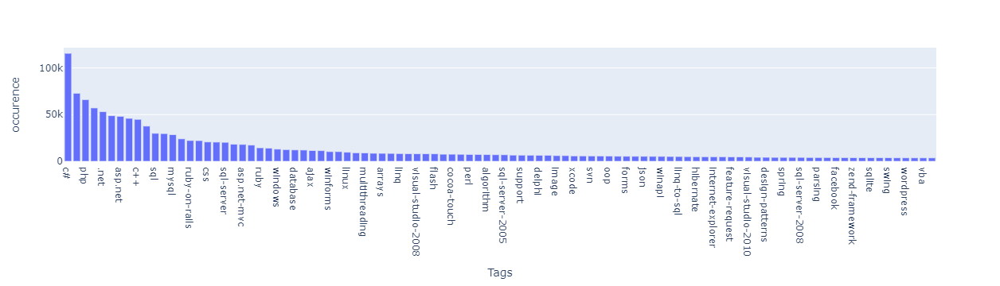

In [61]:
res = Counter(map(str.strip, chain.from_iterable(df["Tags"].fillna('Inconnu').str.split(' '))))
dfTags = pd.DataFrame.from_dict(res, orient='index').reset_index()
dfTags = dfTags.rename(columns={'index':'Tags', 0:'occurence'})
dfTags = dfTags.sort_values("occurence",ascending=False)
fig = px.bar(dfTags.nlargest(100,"occurence"),x="Tags", y = 'occurence')
fig.show()

Nous remarquons un large nombre de questions sur les technologies de programmation avec C#, php et .net en premier position. Le nombre de question relatif aux autres tags semble décroitre assez rapidement.

Le but de notre démarche n'est pas de deviner avec exactitude tous les tags, nous voulons proposer des tags pertinents pour cela nous allons limiter notre dataframe aux question qui se rapportent aux 30 tags les plus fréquents.

In [62]:
listTag30 = dfTags.nlargest(10,"occurence").Tags

In [63]:
listTag30.values

array(['c#', 'java', 'php', 'javascript', '.net', 'jquery', 'asp.net',
       'iphone', 'c++', 'python'], dtype=object)

In [64]:
df['Tags_new'] = df['Tags'].apply(lambda x: x.split())

In [65]:
def most_common(tags):
    tags_filtered = []
    for i in range(0, len(tags)):
        if tags[i] in listTag30.values:
            tags_filtered.append(tags[i])
    return tags_filtered

In [66]:
df['Tags_new'] = df['Tags_new'].apply(lambda x: most_common(x))

In [67]:
df['Tags_new'] = df['Tags_new'].apply(lambda x: x if len(x)>0 else None)

In [68]:
df = df[~df.Tags_new.isna()]

In [69]:
print_now()

now = 2022-08-20 10:40:49.239524


## Questions n'ayant pas eu de réponse

Quand on applique les bons tags les experts du tag ou de la technologie reçoive une notification pour pouvoir répondre à la question. Les questions sans réponse ont peut être pas les bons tags. Pour pouvoir limiter encore notre dataframe d'apprentissage nous prenons la décision de se débarasser des questions n'ayant pas eu de réponse.

In [70]:
print( 'Nombre de questions sans réponse : ' + str(len(df[df.AnswerCount == 0])))

Nombre de questions sans réponse : 2860


In [71]:
df = df[df.AnswerCount > 0]

In [72]:
df.describe()

,Id,Score,AnswerCount,rank,NumberTags
count,5.078380e+05,507838.000000,507838.000000,507838.000000,507838.000000
mean,2.389777e+06,10.419744,3.066661,515422.987346,3.064714
std,1.119796e+06,75.044043,2.818715,278216.207178,1.141195
min,2.380100e+05,-146.000000,1.000000,30000.000000,1.000000
25%,1.452035e+06,0.000000,1.000000,275053.250000,2.000000
50%,2.453126e+06,2.000000,2.000000,515609.500000,3.000000
75%,3.354386e+06,5.000000,4.000000,754902.750000,4.000000
max,4.242334e+06,8117.000000,150.000000,999999.000000,5.000000


## Score

In [73]:
df.Score.describe()

count    507838.000000
mean         10.419744
std          75.044043
min        -146.000000
25%           0.000000
50%           2.000000
75%           5.000000
max        8117.000000
Name: Score, dtype: float64

Le score correspond au nombre de personne ayant voté positivement pour la question moins le nombre de personne ayant voté negativement. Elle reflète donc la pertinence d'une question. Plus une question est pertinente plus il y a de chance que le tag associé est bon car la question a eu beaucoup de visibilité.

Notre dataframe étant trop volumineux pour être traité en entier sur une simple machine, nous allons donc faire le choix de selectionner les 80 000 premières questions en terme de score.

In [74]:
numberToKeep = 200000
df = df.nlargest(numberToKeep,"Score")

In [75]:
df

,Id,Score,Body,Title,Tags,AnswerCount,rank,NumberTags,Tags_new
247874,1335851,8117,"<p>Recently, I ran some of my JavaScript code ...","What does ""use strict"" do in JavaScript, and w...",javascript syntax jslint use-strict,29,247875,4,[javascript]
74234,503093,7710,<p>How can I redirect the user from one page t...,How do I redirect to another webpage?,javascript jquery redirect,58,74235,3,"[javascript, jquery]"
353925,1789945,7417,<p>Usually I would expect a <code>String.conta...,How to check whether a string contains a subst...,javascript string substring string-matching,3,353926,4,[javascript]
46756,336859,7364,<p>I've recently started maintaining someone e...,var functionName = function() {} vs function f...,javascript function syntax idioms,42,46757,4,[javascript]
59969,419163,7332,"<p>Given the following code, what does the <co...","What does if __name__ == ""__main__"": do?",python namespaces main python-module idioms,39,59970,5,[python]
...,...,...,...,...,...,...,...,...,...
953776,4074565,3,<blockquote>\n <p><strong>Possible Duplicate:...,How do I get details from File Properties?,c# windows filesystems,1,953777,3,[c#]
953811,4074667,3,<p><em>What are the possible options and the m...,How to read content of .EXE file in Java,java binary executable iostream,4,953812,4,[java]
953812,4074670,3,<p>I'm working on a small project (some mark t...,Doctrine 2.0 ready for use?,php orm doctrine doctrine-orm,2,953813,4,[php]
953851,4074802,3,<p>I need to use a C++ XML parser/writer for i...,C++ xml parser with unicode support & without ...,c++ c xml xml-parsing,2,953852,4,[c++]


## Nettoyage du Body

Pour le nettoyage nous allons procéder aux fonctions suivantes :
- Extraire le contenu des balise html 
- Supprimer les caractères spéciaux
- Mettre en miniscule toutes les lettres 
- Enlever les stop words anglais
- Appliquer la méthode de lemmatisation

In [76]:
print_now()

now = 2022-08-20 10:40:51.194618


In [77]:
from bs4 import BeautifulSoup

In [78]:
%%time
df['Body_new'] = df['Body'].apply(lambda x: BeautifulSoup(x).get_text()) 

Wall time: 3min 14s


In [79]:
def pre_process(text): 
    # fetch alphabetic characters
    text = re.sub(r'[^A-Za-z0-9+#.\-]', " ", text)

    # convert text to lower case
    text = text.lower()

    # split text into tokens to remove whitespaces
    tokens = text.split()

    return " ".join(tokens)

In [80]:
%%time
df['Body_new'] = df['Body_new'].apply(pre_process) 

Wall time: 32.9 s


# Nettoyage du titre

Nous allons appliquer la même méthode utilisée pour nettoyer notre body sur le titre

In [81]:
%%time
df['Title_new'] = df['Title'].apply(pre_process)

Wall time: 7.87 s


In [82]:
df['Clean_text'] = df['Title_new'] + ' ' + df['Body_new']

In [83]:
df[['Title', 'Body','Clean_text']]

,Title,Body,Clean_text
247874,"What does ""use strict"" do in JavaScript, and w...","<p>Recently, I ran some of my JavaScript code ...",what does use strict do in javascript and what...
74234,How do I redirect to another webpage?,<p>How can I redirect the user from one page t...,how do i redirect to another webpage how can i...
353925,How to check whether a string contains a subst...,<p>Usually I would expect a <code>String.conta...,how to check whether a string contains a subst...
46756,var functionName = function() {} vs function f...,<p>I've recently started maintaining someone e...,var functionname function vs function function...
59969,"What does if __name__ == ""__main__"": do?","<p>Given the following code, what does the <co...",what does if name main do given the following ...
...,...,...,...
953776,How do I get details from File Properties?,<blockquote>\n <p><strong>Possible Duplicate:...,how do i get details from file properties poss...
953811,How to read content of .EXE file in Java,<p><em>What are the possible options and the m...,how to read content of .exe file in java what ...
953812,Doctrine 2.0 ready for use?,<p>I'm working on a small project (some mark t...,doctrine 2.0 ready for use i m working on a sm...
953851,C++ xml parser with unicode support & without ...,<p>I need to use a C++ XML parser/writer for i...,c++ xml parser with unicode support without co...


### Sauvegarde Dataframe

In [84]:
df = df.reset_index().drop(columns = ["index"])

In [85]:
%%time
df.columns
df = df.drop(columns = ["AnswerCount","rank","NumberTags"])

Wall time: 101 ms


In [86]:
df.columns

Index(['Id', 'Score', 'Body', 'Title', 'Tags', 'Tags_new', 'Body_new',
       'Title_new', 'Clean_text'],
      dtype='object')

In [87]:
df = df.drop(columns = ["Id","Body_new","Title_new"])

In [88]:
%%time
workingDir = os.getcwd()
file_path = os.path.join(workingDir,'Data','prepdata','20Kcleaned_nlp_questions_10.csv')
df.to_csv(file_path,index = False)

Wall time: 42.6 s


In [89]:
print_now()

now = 2022-08-20 10:45:51.110980


In [3]:
%%time
workingDir = os.getcwd()
file_path = os.path.join(workingDir,'Data','prepdata','cleaned_nlp_questions_30.csv')
df = pd.read_csv(file_path)

Wall time: 10.1 s


In [3]:
%%time
df = pd.read_csv("https://www.dropbox.com/s/b7ceq448zlmtxch/cleaned_nlp_questions_30.csv?dl=1")

Wall time: 1min 16s


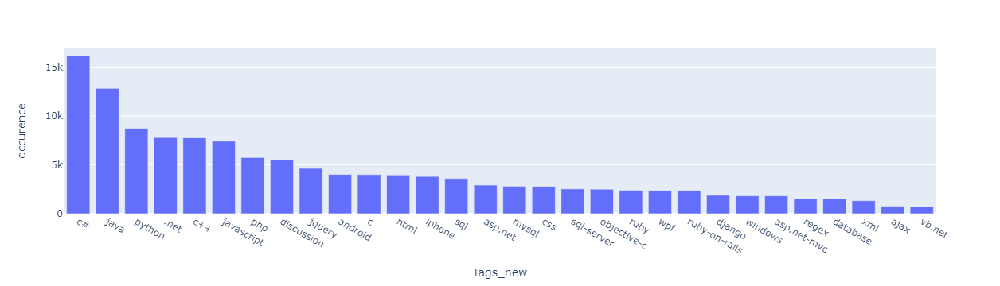

In [50]:
res = Counter(map(str.strip, chain.from_iterable(df["Tags_new"])))
dfTags = pd.DataFrame.from_dict(res, orient='index').reset_index()
dfTags = dfTags.rename(columns={'index':'Tags_new', 0:'occurence'})
dfTags = dfTags.sort_values("occurence",ascending=False)
fig = px.bar(dfTags,x="Tags_new", y = 'occurence')
fig.show()